<a href="https://colab.research.google.com/github/Murcha1990/ML_AI25/blob/main/Hometasks/Base/HW1_Regression_with_inference_base_pt1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (base). Часть 1**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;

**Максимальная оценка за дз**
> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$


**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.**

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
from IPython.display import display, Markdown
from ydata_profiling import ProfileReport
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.metrics import r2_score, mean_squared_error as MSE, mean_absolute_error as MAE
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
import pickle
import os

pd.set_option('display.width', None)
import warnings
warnings.filterwarnings('ignore')

random.seed(42)
np.random.seed(42)

%matplotlib inline

Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

Короткий ответ: для того, чтобы результаты были воспроизводимыми

Длинный ответ: если не фиксировать random.seed, то, например, при разбиении на train и test мы при каждом запуске будем получать разное разбиение и, соответсвенно, качество нашей модели может изменяться не из-за того, что мы что-то улучшили, а из-за того, что мы перезапустили ячейки и изменилась разбивка

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [2]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1 (0.5 балла)**

Вы уже встречались с pandas в первой половине семестра. Теперь будем постоянно (кроме некоторых случаев) использовать его для анализа данных и наслаивать навыки. Выполните операции, направленные на практику основных действий с `pandas`:

**0.1 балла**
- [ ] Отобразите 30 случайных строк тренировочного датасета.
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения
- [ ] Посмотрите, есть ли в данных явные дубликаты


**0.2 балла**
Ответьте на вопросы:
- [ ] Выводы о чем можно сделать, используя случайные/верхние/нижние строки? А о чем нельзя?
- [ ] Достаточно ли метода duplicated для анализа дубликатов? Почему?

**0.15 балла**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)

In [3]:
# Пункт 1. 30 случайных строк
df_train.sample(30)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


In [4]:
# 5 первых строк
df_test.head(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


In [5]:
# 5 последних строк
df_test.tail(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


In [6]:
# Пропуски
def missed_values(df):
    cols_with_missed_values = set()
    print('Общее инфо про датафрейм:')
    print(df.info())
    print()
    print('Есть пропуски в столбцах:')
    for col in df.columns:
        if df[col].isnull().sum() > 0:
            print(f'{col}: {df[col].isnull().sum()} пропусков')
            cols_with_missed_values.add(col)
    return cols_with_missed_values
            

display(Markdown("**df_train:**"))
cols1 = missed_values(df_train)
print()
display(Markdown("**df_test:**"))
cols2 = missed_values(df_test)
cols_with_missed_values = cols1.union(cols2)

**df_train:**

Общее инфо про датафрейм:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6999 entries, 0 to 6998
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           6999 non-null   object 
 1   year           6999 non-null   int64  
 2   selling_price  6999 non-null   int64  
 3   km_driven      6999 non-null   int64  
 4   fuel           6999 non-null   object 
 5   seller_type    6999 non-null   object 
 6   transmission   6999 non-null   object 
 7   owner          6999 non-null   object 
 8   mileage        6797 non-null   object 
 9   engine         6797 non-null   object 
 10  max_power      6803 non-null   object 
 11  torque         6796 non-null   object 
 12  seats          6797 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 711.0+ KB
None

Есть пропуски в столбцах:
mileage: 202 пропусков
engine: 202 пропусков
max_power: 196 пропусков
torque: 203 пропусков
seats: 202 пропуско

**df_test:**

Общее инфо про датафрейм:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           1000 non-null   object 
 1   year           1000 non-null   int64  
 2   selling_price  1000 non-null   int64  
 3   km_driven      1000 non-null   int64  
 4   fuel           1000 non-null   object 
 5   seller_type    1000 non-null   object 
 6   transmission   1000 non-null   object 
 7   owner          1000 non-null   object 
 8   mileage        981 non-null    object 
 9   engine         981 non-null    object 
 10  max_power      981 non-null    object 
 11  torque         981 non-null    object 
 12  seats          981 non-null    float64
dtypes: float64(1), int64(3), object(9)
memory usage: 101.7+ KB
None

Есть пропуски в столбцах:
mileage: 19 пропусков
engine: 19 пропусков
max_power: 19 пропусков
torque: 19 пропусков
seats: 19 пропусков


Пропуски есть и в df_train и в df_test. В столбцах: mileage, engine, max_power, torque, seats

In [7]:
# Дубликаты
print(f'Дубликаты в df_train: {df_train.duplicated().any()}')
print(f'Дубликаты в df_test: {df_test.duplicated().any()}')
# Вывод: есть дубликаты в обоих датасетах

Дубликаты в df_train: True
Дубликаты в df_test: True


In [8]:
# Показывает все повторяющиеся строки (благодаря keep=False)
df_train_dup = df_train[df_train.duplicated(keep=False)]
print(f'Кол-во дублирующихся строк (все экземпляры дубликатов) в df_train: {len(df_train_dup)}')
df_train_dup.sort_values(['name', 'year', 'selling_price']).head(5)

Кол-во дублирующихся строк (все экземпляры дубликатов) в df_train: 1478


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
1703,Audi Q3 2.0 TDI Quattro Premium Plus,2017,2825000,22000,Diesel,Dealer,Automatic,First Owner,15.73 kmpl,1968 CC,174.33 bhp,380Nm@ 1750-2500rpm,5.0
6307,Audi Q3 2.0 TDI Quattro Premium Plus,2017,2825000,22000,Diesel,Dealer,Automatic,First Owner,15.73 kmpl,1968 CC,174.33 bhp,380Nm@ 1750-2500rpm,5.0
1836,Audi Q5 3.0 TDI Quattro,2014,1850000,76131,Diesel,Individual,Automatic,First Owner,13.22 kmpl,2967 CC,241.4 bhp,580Nm@ 1400-3250rpm,5.0
6704,Audi Q5 3.0 TDI Quattro,2014,1850000,76131,Diesel,Individual,Automatic,First Owner,13.22 kmpl,2967 CC,241.4 bhp,580Nm@ 1400-3250rpm,5.0
117,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0


In [9]:
df_test_dup = df_test[df_test.duplicated(keep=False)]
print(f'Кол-во дублирующихся строк (все экземпляры дубликатов) в df_test: {len(df_test_dup)}')
df_test_dup.sort_values(['name', 'year', 'selling_price']).head(5)

Кол-во дублирующихся строк (все экземпляры дубликатов) в df_test: 95


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
61,BMW X4 M Sport X xDrive20d,2019,5400000,7500,Diesel,Dealer,Automatic,First Owner,16.78 kmpl,1995 CC,190 bhp,400Nm@ 1750-2500rpm,5.0
515,BMW X4 M Sport X xDrive20d,2019,5400000,7500,Diesel,Dealer,Automatic,First Owner,16.78 kmpl,1995 CC,190 bhp,400Nm@ 1750-2500rpm,5.0
201,BMW X4 M Sport X xDrive20d,2019,5500000,8500,Diesel,Dealer,Automatic,First Owner,16.78 kmpl,1995 CC,190 bhp,400Nm@ 1750-2500rpm,5.0
600,BMW X4 M Sport X xDrive20d,2019,5500000,8500,Diesel,Dealer,Automatic,First Owner,16.78 kmpl,1995 CC,190 bhp,400Nm@ 1750-2500rpm,5.0
777,BMW X4 M Sport X xDrive20d,2019,5500000,8500,Diesel,Dealer,Automatic,First Owner,16.78 kmpl,1995 CC,190 bhp,400Nm@ 1750-2500rpm,5.0


In [10]:
#Кол-во дублирующихся строк (уникальные строки, у которых есть повторы)
print(f'Кол-во дублирующихся строк в df_train: {len(df_train[df_train.duplicated(keep=False)].drop_duplicates())}')
print(f'Кол-во дублирующихся строк в df_test: {len(df_test[df_test.duplicated(keep=False)].drop_duplicates())}')


Кол-во дублирующихся строк в df_train: 493
Кол-во дублирующихся строк в df_test: 33


Пункт 2
1) По случайной выборке и топу, окончанию можно понять, какие есть столбцы, какого они типа, в каких диапазонах (примерно) находятся их значения. То есть мы можем (осторожно) сдлеать выводы о том, как выглядит наш датасет. Также по сравнению head и tail можно прикинуть, был ли датасет отсортирован по какому-то столбцу.
Тем не менее делать какие-то финальные выводы про распределения параметров, их мин, макс, средние и тд, про конечное кол-во категорий в категориальных столбцах, наличие/отсутствие пропусков/дублей/выбросов нельзя, тк мы видим не все объекты, для этого нужно проводить доп. тесты

2) duplicated показывает полные дубли по строкам, но не показывает частичные (например, если фичи дублируются, но таргет нет), поэтому лучше проводить доп проверки

In [11]:
# Пункт 3
profile_report_train = ProfileReport(df_train, title='Pandas Profiling Report Train')
profile_report_test = ProfileReport(df_test, title='Pandas Profiling Report Test')

'''
profile_report_train.to_file('Selling_Cars_Train_report.html')
profile_report_test.to_file('Selling_Cars_Test_report.html')
'''

"\nprofile_report_train.to_file('Selling_Cars_Train_report.html')\nprofile_report_test.to_file('Selling_Cars_Test_report.html')\n"

In [12]:
profile_report_train

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:00<00:00, 382.93it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
profile_report_test

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 13/13 [00:00<00:00, 4359.63it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Выводы по дашбордам:**

**df_train:**
- в датасете довольно много дублирующихся строк (7%)
- в нескольких столбцах есть пропуски (но не в таргете)
- некоторые переменные имеют высокую корреляцию с ценой (transmission, year)

**df_test:**
- все еще есть дубли, но меньше (3%)
  
  В остальном то же самое:
- в нескольких столбцах есть пропуски (но не в таргете)
- некоторые переменные имеют высокую корреляцию с ценой (transmission, year)

Мы обнаружили пропуски. Давайте избавимся от них.

**(0.05 балла)**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете про *тренировочному* набору данных и им же заполняете *тестовый*.

In [14]:
# Посмотрим, как выглядят столбцы, в которых есть пропуски
df_categ_train = df_train[list(cols_with_missed_values)]
df_categ_test = df_test[list(cols_with_missed_values)]
df_categ_train.head()


,engine,mileage,max_power,seats,torque
0,1248 CC,23.4 kmpl,74 bhp,5.0,190Nm@ 2000rpm
1,1498 CC,21.14 kmpl,103.52 bhp,5.0,250Nm@ 1500-2500rpm
2,1396 CC,23.0 kmpl,90 bhp,5.0,22.4 kgm at 1750-2750rpm
3,1298 CC,16.1 kmpl,88.2 bhp,5.0,"11.5@ 4,500(kgm@ rpm)"
4,1197 CC,20.14 kmpl,81.86 bhp,5.0,113.75nm@ 4000rpm


In [15]:
# И сколько этих пропусков
display(Markdown("**df_train:**"))
missed_values(df_categ_train)
display(Markdown("**df_test:**"))
missed_values(df_categ_test)


**df_train:**

Общее инфо про датафрейм:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6999 entries, 0 to 6998
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   engine     6797 non-null   object 
 1   mileage    6797 non-null   object 
 2   max_power  6803 non-null   object 
 3   seats      6797 non-null   float64
 4   torque     6796 non-null   object 
dtypes: float64(1), object(4)
memory usage: 273.5+ KB
None

Есть пропуски в столбцах:
engine: 202 пропусков
mileage: 202 пропусков
max_power: 196 пропусков
seats: 202 пропусков
torque: 203 пропусков


**df_test:**

Общее инфо про датафрейм:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   engine     981 non-null    object 
 1   mileage    981 non-null    object 
 2   max_power  981 non-null    object 
 3   seats      981 non-null    float64
 4   torque     981 non-null    object 
dtypes: float64(1), object(4)
memory usage: 39.2+ KB
None

Есть пропуски в столбцах:
engine: 19 пропусков
mileage: 19 пропусков
max_power: 19 пропусков
seats: 19 пропусков
torque: 19 пропусков


{'engine', 'max_power', 'mileage', 'seats', 'torque'}

В df_train и df_test одинаковые столбцы, в которых есть пропуски, только медиану взять по ним сложно, так как они не числовые (за исключением seats)

torque не кажется возможным перевести в числовое значение, поэтому его пропустим

По остальным столбцам проверим, действительно ли они все заканчиваются на одинаковые буквенные символы (то есть имеют одинаковые единицы измерения) и если их убрать, то получим числа

In [16]:
df_train[['mileage_val', 'mileage_suf']] = df_train['mileage'].str.split(' ', n=1, expand=True)
df_test[['mileage_val', 'mileage_suf']] = df_test['mileage'].str.split(' ', n=1, expand=True)

df_train[['max_power_val', 'max_power_suf']] = df_train['max_power'].str.split(' ', n=1, expand=True)
df_test[['max_power_val', 'max_power_suf']] = df_test['max_power'].str.split(' ', n=1, expand=True)

df_train[['engine_val', 'engine_suf']] = df_train['engine'].str.split(' ', n=1, expand=True)
df_test[['engine_val', 'engine_suf']] = df_test['engine'].str.split(' ', n=1, expand=True)

print(f"df_train['mileage_suf']: {df_train['mileage_suf'].value_counts(dropna=False)}")
print(f"\ndf_test['mileage_suf']: {df_test['mileage_suf'].value_counts(dropna=False)}")
print(f"\ndf_train['max_power_suf']: {df_train['max_power_suf'].value_counts(dropna=False)}")
print(f"\ndf_test['max_power_suf']: {df_test['max_power_suf'].value_counts(dropna=False)}")
print(f"\ndf_train['engine_suf']: {df_train['engine_suf'].value_counts(dropna=False)}")
print(f"\ndf_test['engine_suf']: {df_test['engine_suf'].value_counts(dropna=False)}")


df_train['mileage_suf']: mileage_suf
kmpl     6718
NaN       202
km/kg      79
Name: count, dtype: int64

df_test['mileage_suf']: mileage_suf
kmpl     972
NaN       19
km/kg      9
Name: count, dtype: int64

df_train['max_power_suf']: max_power_suf
bhp     6797
NaN      196
None       6
Name: count, dtype: int64

df_test['max_power_suf']: max_power_suf
bhp    981
NaN     19
Name: count, dtype: int64

df_train['engine_suf']: engine_suf
CC     6797
NaN     202
Name: count, dtype: int64

df_test['engine_suf']: engine_suf
CC     981
NaN     19
Name: count, dtype: int64


Оказалось, что в mileage_suf есть разные измерения значений: км на литр и км на кг. Судя по тому, что удалось нагуглить, это в принципе разные единицы измерения и перевести km/kg в kmpl нельзя. Но у нас немного объектов с единицей измерения km/kg, поэтому в таких строках удалим значения по этому столбцу, а после заполним их медианами (как и все остальные пропуски), чтобы не было искажения данных

А в max_power_suf в df_train не 196 пропусков (как показывало info), а 202, тк есть None, которое странно выглядит по сранению с остальными строками (ячека ниже). Везде в max_power стоит 0 и никакого суффикса. Полагаю, что это скорее NaN, а не 0, тк иначе было бы 0 bhp

In [17]:
df_train[df_train['max_power_suf'].apply(lambda x: x is None)]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,mileage_val,mileage_suf,max_power_val,max_power_suf,engine_val,engine_suf
503,Maruti Alto K10 LXI,2011,204999,97500,Petrol,Individual,Manual,First Owner,NaN,NaN,0,NaN,NaN,NaN,NaN,0,None,NaN,NaN
504,Maruti Alto K10 LXI,2011,204999,97500,Petrol,Individual,Manual,First Owner,NaN,NaN,0,NaN,NaN,NaN,NaN,0,None,NaN,NaN
1238,Maruti Swift Dzire VDI Optional,2017,589000,41232,Diesel,Dealer,Manual,First Owner,NaN,NaN,0,NaN,NaN,NaN,NaN,0,None,NaN,NaN
1239,Maruti Swift Dzire VDI Optional,2017,589000,41232,Diesel,Dealer,Manual,First Owner,NaN,NaN,0,NaN,NaN,NaN,NaN,0,None,NaN,NaN
2196,Tata Indica Vista Quadrajet LS,2012,240000,70000,Diesel,Individual,Manual,First Owner,NaN,NaN,0,NaN,NaN,NaN,NaN,0,None,NaN,NaN
2197,Tata Indica Vista Quadrajet LS,2012,240000,70000,Diesel,Individual,Manual,First Owner,NaN,NaN,0,NaN,NaN,NaN,NaN,0,None,NaN,NaN


In [18]:
# Сгенерировано ИИ
# Заменим 0 на NaN
df_train.loc[df_train['max_power_suf'].apply(lambda x: x is None), 'max_power_val'] = np.nan

In [19]:
# Удалим значения если mileage измерялось в km/kg
df_train['mileage_val'] = np.where(df_train['mileage_suf'] == 'km/kg', np.nan, df_train['mileage_val'])
df_test['mileage_val'] = np.where(df_test['mileage_suf'] == 'km/kg', np.nan, df_test['mileage_val'])

In [20]:
# Значения в колонках val можно посмотреть и убедиться, что там везде числа, кроме 
# df_train['max_power_val'] где есть '', заменим его на nan

'''
with pd.option_context('display.max_rows', None):
    print(df_train['max_power_val'].value_counts(dropna=False).sort_index())
'''
print(df_train['max_power_val'].value_counts(dropna=False).sort_index())
df_train['max_power_val'] = np.where(df_train['max_power_val'] == '', np.nan, df_train['max_power_val'])

max_power_val
            1
100        79
100.5       2
100.57      4
100.6      79
         ... 
98.97       2
99         34
99.23       1
99.6        7
NaN       202
Name: count, Length: 316, dtype: int64


In [21]:
# Мы все проверили, поэтому теперь удалим лишние столбцы и приведем итоговые столбцы к float
cols_temp = ['engine', 'max_power', 'mileage']
for col in cols_temp:
    col_val = str(col) + '_val'
    col_suf = str(col) + '_suf'
    df_train[col] = df_train[col_val].astype('float')
    df_test[col] = df_test[col_val].astype('float')

    df_train = df_train.drop([col_val, col_suf], axis=1)
    df_test = df_test.drop([col_val, col_suf], axis=1)
df_test.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0,2498.0,112.0,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5,1497.0,108.5,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9,1799.0,130.0,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1,1498.0,98.6,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5,1172.0,65.0,96 Nm at 3000 rpm,5.0


In [22]:
# Для задания 5
df_train_copy = df_train.copy()
df_test_copy = df_test.copy()

In [23]:
# Наконец заменяем пропуски на медиану
cols_categ = ['engine', 'max_power', 'mileage', 'seats']
for col in cols_categ:
    med_col = df_train[col].median()
    df_train[col] = df_train[col].fillna(med_col)
    df_test[col] = df_test[col].fillna(med_col)

display(Markdown("**df_train:**"))
missed_values(df_train)
display(Markdown("**df_test:**"))
missed_values(df_test)

**df_train:**

Общее инфо про датафрейм:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6999 entries, 0 to 6998
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           6999 non-null   object 
 1   year           6999 non-null   int64  
 2   selling_price  6999 non-null   int64  
 3   km_driven      6999 non-null   int64  
 4   fuel           6999 non-null   object 
 5   seller_type    6999 non-null   object 
 6   transmission   6999 non-null   object 
 7   owner          6999 non-null   object 
 8   mileage        6999 non-null   float64
 9   engine         6999 non-null   float64
 10  max_power      6999 non-null   float64
 11  torque         6796 non-null   object 
 12  seats          6999 non-null   float64
dtypes: float64(4), int64(3), object(6)
memory usage: 711.0+ KB
None

Есть пропуски в столбцах:
torque: 203 пропусков


**df_test:**

Общее инфо про датафрейм:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           1000 non-null   object 
 1   year           1000 non-null   int64  
 2   selling_price  1000 non-null   int64  
 3   km_driven      1000 non-null   int64  
 4   fuel           1000 non-null   object 
 5   seller_type    1000 non-null   object 
 6   transmission   1000 non-null   object 
 7   owner          1000 non-null   object 
 8   mileage        1000 non-null   float64
 9   engine         1000 non-null   float64
 10  max_power      1000 non-null   float64
 11  torque         981 non-null    object 
 12  seats          1000 non-null   float64
dtypes: float64(4), int64(3), object(6)
memory usage: 101.7+ KB
None

Есть пропуски в столбцах:
torque: 19 пропусков


{'torque'}

Итого пропуски остались только в torque, который нельзя перевести в числовой вид, в остальном заменили медианой из df_train

### **Задание 2 (0.5 балла)**

На прошлом шаге вы убедились, что явных дубликатов в таблице нет. Однако дубликат может быть связан с не только полным повторением информации в нескольких строках, но и частиным. Например, объект мог был внесен в базу данных с разным значением целевой переменной. В этом шаге займемся такими дублями!

**Ваши действия:**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
- [ ] Отобразите такие объекты (0.15 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)


In [24]:
# Пункт 1
df_train_features = df_train.drop(['selling_price'], axis=1)
df_train_features.head()

,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,113.75nm@ 4000rpm,5.0


In [25]:
#Кол-во дублирующихся строк
df_train_features_dup = df_train_features[df_train_features.duplicated(keep=False)]
df_train_features_dup_unique = df_train_features[df_train_features.duplicated(keep=False)].drop_duplicates()
print(f'Кол-во дублирующихся строк (все экземпляры дубликатов) в df_train_features: {len(df_train_features_dup)}')
print(f'Кол-во дублирующихся строк (уникальные) в df_train_features: {len(df_train_features_dup_unique)}')


Кол-во дублирующихся строк (все экземпляры дубликатов) в df_train_features: 1799
Кол-во дублирующихся строк (уникальные) в df_train_features: 640


In [26]:
# Пункт 2
df_train_features_dup_unique.sort_values(['name', 'year', 'km_driven']).head(5)

,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
1703,Audi Q3 2.0 TDI Quattro Premium Plus,2017,22000,Diesel,Dealer,Automatic,First Owner,15.73,1968.0,174.33,380Nm@ 1750-2500rpm,5.0
1836,Audi Q5 3.0 TDI Quattro,2014,76131,Diesel,Individual,Automatic,First Owner,13.22,2967.0,241.40,580Nm@ 1400-3250rpm,5.0
117,Audi Q5 35TDI Premium Plus,2018,31800,Diesel,Dealer,Automatic,First Owner,17.01,1968.0,188.00,400nm@ 1750-3000rpm,5.0
1779,BMW 3 Series 320d Luxury Line,2012,140000,Diesel,Individual,Automatic,Second Owner,18.88,1995.0,184.00,380Nm@ 1750-2750rpm,5.0
2886,BMW 3 Series 320d Luxury Line Plus,2017,44000,Diesel,Dealer,Automatic,First Owner,22.69,1995.0,190.00,400Nm@ 1750-2750rpm,5.0


In [27]:
# Пункт 3 и 4. Удаляем дубли, оставляя первое вхождение
# subset=df_train.columns.difference(['selling_price']) было сгенерировано с помощью ИИ
df_train = df_train.drop_duplicates(subset=df_train.columns.difference(['selling_price']), keep='first').reset_index(drop=True)


In [28]:
assert df_train.shape == (5840, 13)

Отлично! Мы избавились от маленьких и явных проблем. Теперь перейдем к более сложным недостаткам полученной таблицы.

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Удалите столбец ``torque``


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

П1 и п2 уже сделала ранее, когда вычисляла медианное значение

In [29]:
# Пункт 3. Удалим столбец torque
df_train = df_train.drop('torque', axis=1)
df_test = df_test.drop('torque', axis=1)
df_train.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,5.0


### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

In [30]:
# Для обоих датасетов приводим engine и seats к int
df_train['engine'] = df_train['engine'].astype('int')
df_train['seats'] = df_train['seats'].astype('int')
df_test['engine'] = df_test['engine'].astype('int')
df_test['seats'] = df_test['seats'].astype('int')

df_train.dtypes


name              object
year               int64
selling_price      int64
km_driven          int64
fuel              object
seller_type       object
transmission      object
owner             object
mileage          float64
engine             int64
max_power        float64
seats              int64
dtype: object

In [31]:
df_test.dtypes

name              object
year               int64
selling_price      int64
km_driven          int64
fuel              object
seller_type       object
transmission      object
owner             object
mileage          float64
engine             int64
max_power        float64
seats              int64
dtype: object

### **Задание 5 (0.15 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сделайте вывод.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

В пред пункте видели, что в df_train и df_test есть только типы object, float и int

In [32]:
# Пункт 1. Статистика по числовым признакам
# для df_train
# до заполнения пропусков
pd.set_option('display.float_format', '{:.2f}'.format)
df_train_copy.describe(exclude=['object'])

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,6999.00,6999.00,6999.00,6718.00,6797.00,6796.00,6797.00
mean,2013.82,639515.20,69584.62,19.40,1458.33,91.58,5.42
std,4.05,808941.91,57724.00,4.01,501.18,35.73,0.97
min,1983.00,29999.00,1.00,0.00,624.00,32.80,2.00
25%,2011.00,254999.00,35000.00,16.78,1197.00,68.05,5.00
50%,2015.00,450000.00,60000.00,19.30,1248.00,82.00,5.00
75%,2017.00,675000.00,97000.00,22.32,1582.00,102.00,5.00
max,2020.00,10000000.00,2360457.00,42.00,3604.00,400.00,14.00


In [33]:
# для df_train
# после заполнения пропусков
df_train.describe(exclude=['object'])

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,5840.00,5840.00,5840.00,5840.00,5840.00,5840.00,5840.00
mean,2013.43,522960.09,73952.24,19.39,1429.45,87.95,5.43
std,4.10,535432.00,60071.14,3.92,485.66,31.58,0.98
min,1983.00,29999.00,1.00,0.00,624.00,32.80,2.00
25%,2011.00,250000.00,39000.00,17.00,1197.00,68.00,5.00
50%,2014.00,405000.00,70000.00,19.30,1248.00,82.00,5.00
75%,2017.00,640000.00,100000.00,22.07,1498.00,99.00,5.00
max,2020.00,10000000.00,2360457.00,42.00,3604.00,400.00,14.00


In [34]:
# для df_test
# до заполнения пропусков
df_test_copy.describe(exclude=['object'])

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,1000.00,1000.00,1000.00,972.00,981.00,981.00,981.00
mean,2013.68,617901.04,71393.34,19.32,1458.88,91.02,5.41
std,4.01,758553.86,48486.22,3.97,526.23,35.21,0.92
min,1995.00,31000.00,1303.00,0.00,624.00,34.20,4.00
25%,2011.00,250000.00,37000.00,16.50,1197.00,69.00,5.00
50%,2014.00,434999.00,61500.00,19.33,1248.00,83.10,5.00
75%,2017.00,670000.00,100000.00,22.32,1582.00,102.00,5.00
max,2020.00,6000000.00,375000.00,28.40,3604.00,280.00,9.00


In [35]:
# для df_test
# после заполнения пропусков
df_test.describe(exclude=['object'])

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00,1000.00
mean,2013.68,617901.04,71393.34,19.32,1454.88,90.84,5.40
std,4.01,758553.86,48486.22,3.91,522.00,34.89,0.91
min,1995.00,31000.00,1303.00,0.00,624.00,34.20,4.00
25%,2011.00,250000.00,37000.00,16.59,1197.00,69.00,5.00
50%,2014.00,434999.00,61500.00,19.30,1248.00,82.42,5.00
75%,2017.00,670000.00,100000.00,22.30,1582.00,102.00,5.00
max,2020.00,6000000.00,375000.00,28.40,3604.00,280.00,9.00


In [36]:
# Пункт 2. Статистика по категориальным признакам
# для df_train
# до заполнения пропусков
df_train_copy = df_train_copy.drop('torque', axis=1)
df_train_copy.describe(include=['object'])

,name,fuel,seller_type,transmission,owner
count,6999,6999,6999,6999,6999
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,116,3793,5826,6095,4587


In [37]:
# для df_train
# после заполнения пропусков
df_train.describe(include=['object'])

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603


In [38]:
# для df_test
# до заполнения пропусков
df_test_copy = df_test_copy.drop('torque', axis=1)
df_test_copy.describe(include=['object'])

,name,fuel,seller_type,transmission,owner
count,1000,1000,1000,1000,1000
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,15,534,837,877,623


In [39]:
# для df_test
# после заполнения пропусков
df_test.describe(include=['object'])

,name,fuel,seller_type,transmission,owner
count,1000,1000,1000,1000,1000
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,15,534,837,877,623


In [40]:
assert df_train.shape == (5840, 12)

**Пункт 3. ВЫВОДЫ ПО СТАТИСТИКЕ ДО ПРЕОБРАЗОВАНИЙ И ПОСЛЕ**

**df_train**

- Есть некоторые изменения, которые связаны с удалением дублей. В первую очередь упало среднее по selling_price на 18%.

- Для признаков, в которых мы заполняли пропуски среднее поменялось незначительно, медиана не изменилась (что логично)

- Ни кол-во категорий, ни самая частая категория не изменились после удаления дублей ни для каких категориальных признаков

**df_test**

Изменения схожие на df_test:

- Среднее по selling_price упало на 11% соответсвенно

- Для признаков, в которых мы заполняли пропуски среднее поменялось незначительно, медиана тоже поменялась (ведь мы заменяли nan на медиану по трейну), но также незначительно

- Ни кол-во категорий, ни самая частая категория не изменились после удаления дублей ни для каких категориальных признаков

**Основной вывод:** при удалении дубликатов вероятно стоило оставлять не первое вхождение, в вхождение со средней (медианой) цены по дублирующимся строкам

**Пункт 3. ВЫВОДЫ ПО СТАТИСТИКЕ МЕЖДУ TRAIN И TEST (после преобразования)**

- В целом кажется, что никаких значительных различий, из-за которых модель будет совсем невалидна, нет. Есть небольшие разницы в средних, но они не критичны, медианы еще более схожи. В train в столбце km_driven есть сильно отличающейся от test минимум (1 vs 1303), максимум у mileage и max_power тоже имеют большие относительные отличия, но опять же средние и медианы не имеют значительных различий, поэтому это не должно стть препятсвием для модели

- По категориальным признакам train и test тоже не сильно отличаются, за исключением столбца name. В нем изменилась самая частая категория и у test в 3 раза меньше уникальных категорий, что может быть объяснено меньшей выборкой, в которую смогли попасть не все категории

## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

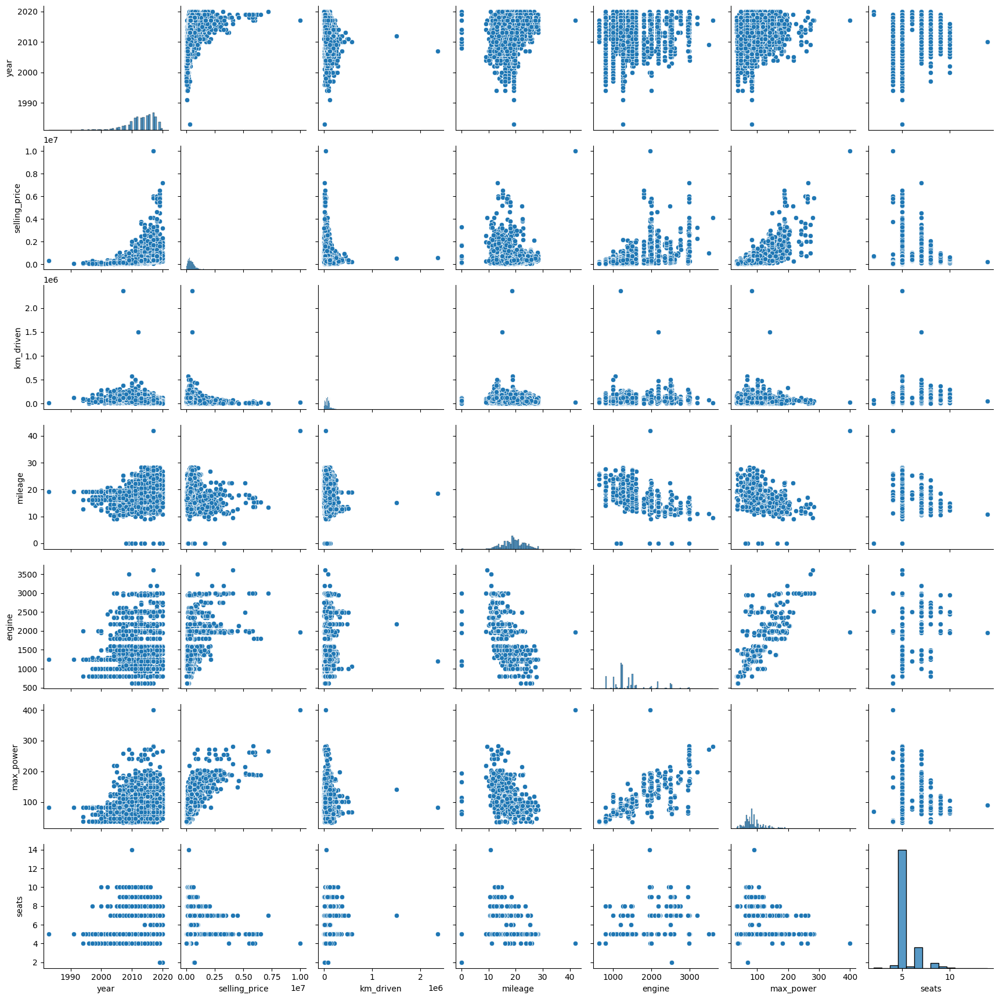

In [41]:
# Шаг 1
# pairplot train
# Примечание: seats пока отношу к числовым, а не категориальным признакам (как в задании 8)
num_cols = df_train.select_dtypes(exclude=['object']).columns

sns.pairplot(df_train[num_cols])


Выводы:

1) Да, видно, что цена действительно коррелирует с некоторыми признаками. Прямопропорционально с year, engine (при маленьких значениях признака маленькая цена, но при дальнейшем увеличении engine зависимость не такая четкая) и max_power. Обратнопропорционально с km_driven. В целом, это довольно логичные взаимосвязи
Также кажется, что цена не имеет особой связи с mileage. А вот зависимость цены от кол-ва сидений сначала кажется нелогичной: у машин с большим кол-вом сидений цена ниже. Можно предположить, легковые машины, как правило, стоят больше микроавтобусов (?)

2) Судя по графику, у engine, max_power и mileage может быть довольно высокая попарная корреляция. В целом, высокая корреляция между engine и max_power ожидаема

Графики остальных признаков не похожи на значительную линейную коррекляцию

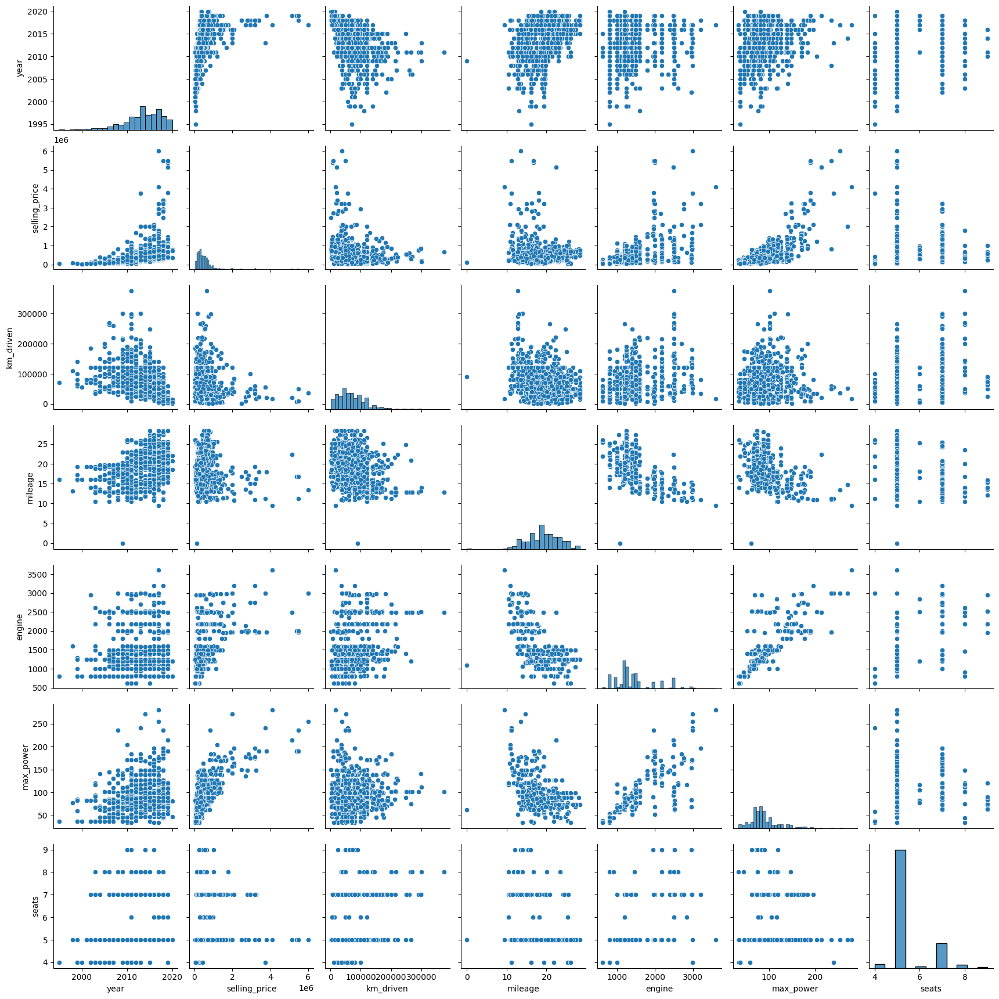

In [42]:
# Шаг 2
# pairplot test
num_cols = df_test.select_dtypes(exclude=['object']).columns
sns.pairplot(df_test[num_cols])

Как и было видно по описательным статистикам, train и test не имеют существенных отличий. Зависимости цены от фичей у test схожи с train, зависимости между фичами также похожи

### **Задание 7 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


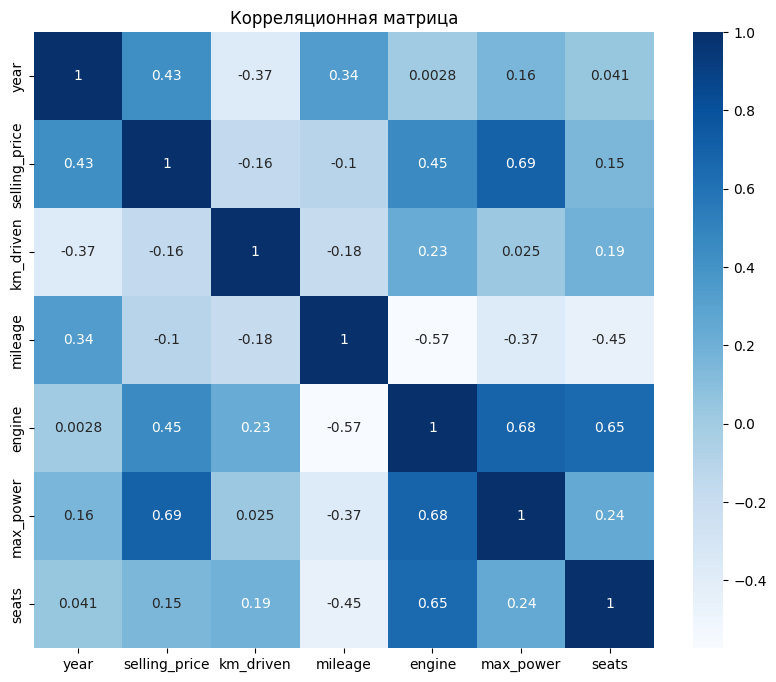

In [43]:
# Расчитаем коэффицент корреляции и построим тепловую карту
corr = df_train.corr(numeric_only=True)
plt.figure(figsize=(10, 8))
sns.heatmap(corr, cmap="Blues", annot=True)
plt.title('Корреляционная матрица')
plt.show()

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

Не все из моих предположений, основанных на графиках, подтвердились, но в целом коэф корреляции ожидаемы.
- Меньше всего коррелируют engine и year, практически нулевая корреляция
- У нас нет совсем высоких корреляций (больше 0.7), тем не менее с ценой хорошо (и положительно) коррелирует max_power; max_power и engine, engine и seats хорошо коррелируют между собой. Цена имеет умеренную корреляцию с engine и year
- Корреляция между годом и кол-вом км имеет корреляцию -0,37. То есть, да, взаимосвязь действительно скорее обратная, чем прямая, но это уже довольно низкий коэффициент корреляции и по scatter plot эту зависимость не особо видно, так что здесь нужно быть аккуратнее с выводами, лучше провести доп исследование

### **Бонус (0.5 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их **и поясните.**

- Каждая дополнительная визуализация может принести до 0.25 баллов при условии, что она обоснована.

**Визуализация 1.** Считаю, что нужно рассмотреть box_plot для таргета, чтобы увидеть есть ли в выборке экстремальные значения или она довольно однородна. Это влияет на наше ожидание от качества модели, тк модель с однородной целевой переменной (при прочих равных) лучше поддается прогнозу

[]

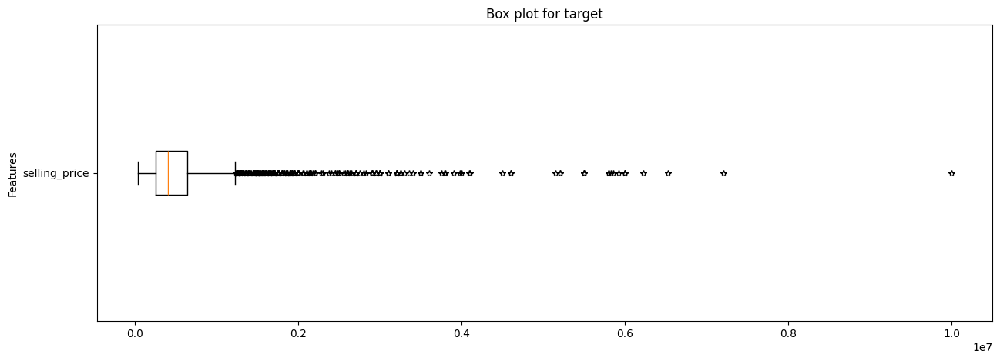

In [44]:
fig,ax = plt.subplots(figsize=(15,5))
ax.boxplot(x=df_train['selling_price'],
           vert=False,
           labels=['selling_price'],
           sym='*'
          )
plt.title('Box plot for target')
plt.ylabel('Features')
plt.plot()

Вывод: действительно есть много экстремальных значений, которые выше чем Q3 + 1,5IQR. Не будем их удалять, так как это не невозможные данные (машина может стоить 10 млн (предположим) долларов)

**Визуализация 2.** Для линейной регрессии также важно понимать, имеет ли целевая переменная нормальное распределение. Если нет, то для получения хороших результатов лучше каким-то образом привести ее к нормальной (например, логорифмировать)

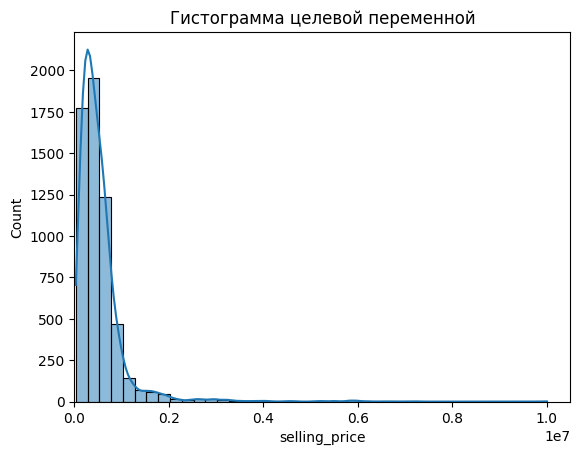

In [45]:
sns.histplot(df_train['selling_price'], bins=40, kde=True)
plt.xlim(0, None)
plt.title('Гистограмма целевой переменной')
plt.show()

Вывод: распределение не похоже на нормальное, для получения лучших результатов следует логарифмировать

**Визуализация 3.**
Следует построить корреляцию Спирмена, так как корреляция Пирсона, которая есть выше, показывает только линейную связь, а корреляция Спирмана может показать монотонную связь между столбцами

<Axes: >

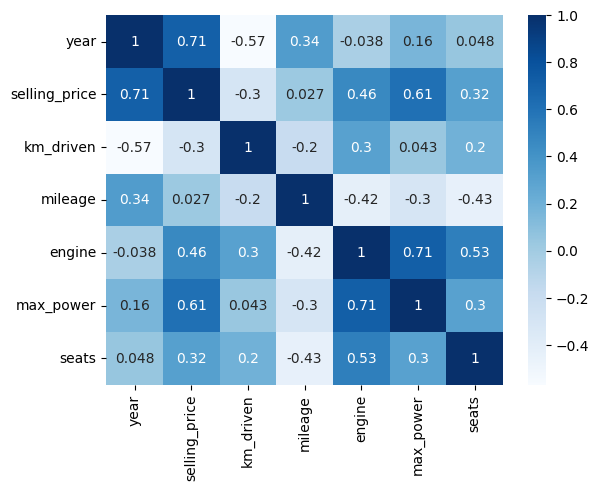

In [46]:
corr = df_train.corr(method='spearman', numeric_only=True)
sns.heatmap(corr, cmap="Blues", annot=True)

Выводы: корреляция Спирмена показала гораздо более высокую корреляцию между ценой и годом выпуска, а также более высокую корреляцию между year и km_driven

**ВЫВОДЫ ПО ЧАСТИ 1:**

После исследования данных и проведенных преобразований получили достаточно хорошие датасеты
- В df_train были удалены дубликаты
- В нескольких столбцах были удалены единицы измерения (прописанные буквами), чтобы была возможность рассчитывать числовую статистику
- В обоих датасетах пропуски были заменены на медианное значение из df_train
- Были найдены коррелирующиеся признаки, которые с одной стороны достаточно высоки, чтобы построение линейной модели имело смысл, с другой стороны, не настолько высокие, чтобы нужно было беспокоиться о мультиколлинеарности
- Выяснили, что выборки df_train и df_test не различаются значительно
- Целевая переменная распределена ненормально

In [47]:
'''
Выгрузка чистых данных для части со Streamlit
df_train['name'] = df_train['name'].str.split(' ', n=1, expand=True)[0].astype('category')
print(f"Кол-во категорий: {len(df_train['name'].cat.categories)}")
df_train.head()

df_test['name'] = df_test['name'].str.split(' ', n=1, expand=True)[0].astype('category')
print(f"Кол-во категорий: {len(df_test['name'].cat.categories)}")
df_test.head()

df_train.to_csv('df_train_clean.csv', index=False)
df_test.to_csv('df_test_clean.csv', index=False)
'''

'\nВыгрузка чистых данных для части со Streamlit\ndf_train[\'name\'] = df_train[\'name\'].str.split(\' \', n=1, expand=True)[0].astype(\'category\')\nprint(f"Кол-во категорий: {len(df_train[\'name\'].cat.categories)}")\ndf_train.head()\n\ndf_test[\'name\'] = df_test[\'name\'].str.split(\' \', n=1, expand=True)[0].astype(\'category\')\nprint(f"Кол-во категорий: {len(df_test[\'name\'].cat.categories)}")\ndf_test.head()\n\ndf_train.to_csv(\'df_train_clean.csv\', index=False)\ndf_test.to_csv(\'df_test_clean.csv\', index=False)\n'

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [48]:
# Примечание: в чате курса было пояснение, что можно не разбивать еще раз на train и test, а взять изначальные
# Выделяем только вещественные признаки
df_train_num = df_train[num_cols]
df_test_num = df_test[num_cols]

# Разбиваем на X и y
X_train = df_train_num.drop('selling_price', axis=1)
y_train = df_train_num[['selling_price']]

X_test = df_test_num.drop('selling_price', axis=1)
y_test = df_test_num[['selling_price']]

In [49]:
assert X_train.shape == (5840, 6)

In [50]:
assert X_test.shape == (1000, 6)

### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [51]:
# Обучаем модель
model = LinearRegression()
model.fit(X_train, y_train)
pred1 = model.predict(X_test)


In [52]:
# Метрики качества
# Кроме MSE и R2 добавила также добавила MAE и RMSE, так как по MSE сложно делать вывод о том, насколько это большая ошибка
def reg_metrics(y_test, pred):
    print(f'''Metrics:
    MSE = {MSE(y_test, pred):,.0f}
    R2 = {r2_score(y_test, pred):.4f}
    MAE = {MAE(y_test, pred):,.0f}
    RMSE = {MSE(y_test, pred) ** 0.5:,.0f}
    ''')
    return MSE(y_test, pred), r2_score(y_test, pred)

pred_train1 = model.predict(X_train)
print('Для трейна:')
reg_metrics(y_train, pred_train1)

print('Для теста:')
reg_metrics(y_test, pred1)

Для трейна:
Metrics:
    MSE = 116,616,259,932
    R2 = 0.5932
    MAE = 183,598
    RMSE = 341,491
    
Для теста:
Metrics:
    MSE = 233,059,669,372
    R2 = 0.5946
    MAE = 224,623
    RMSE = 482,763
    


(233059669371.74857, 0.5945579476077065)

In [53]:
model.coef_

array([[ 3.72804684e+04, -7.32816571e-01,  7.32481254e+03,
         1.22271505e+02,  1.02646988e+04, -2.27409058e+04]])

С интерпретацией MSE стандартная проблема: она не ограничена сверху и измеряется в величине в квадрате (в нашем случае валюта^2), поэтому сказать большая она или нет нельзя. Тем не менее на тесте она выше, чем на трейне (хотя по RMSE не так сильно), вероятно это из-за того, что на трейне мы обучались, а тест - это новые данные

R2, с другой стороны ограничен сверху (единичкой) и по нему можно сделать вывод, что результат в 0.595 - нормальный резултат для бейзлайн модели. При этом r2 на трейне практически такой же, что значит, что модель не переучилась

### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [54]:
# Добавляем стандартизацию признаков с помощью StandardScaler и обучаем линейную регрессию
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)  # обучили и тут же применили к X_train
X_test_scaled = scaler.transform(X_test) # НЕ обучали, но применили к X_test

model_scaler = LinearRegression()
model_scaler.fit(X_train_scaled, y_train)
pred2 = model_scaler.predict(X_test_scaled)

pred_train2 = model_scaler.predict(X_train_scaled)
print('Для трейна:')
reg_metrics(y_train, pred_train2)

print('Для теста:')
reg_metrics(y_test, pred2)

Для трейна:
Metrics:
    MSE = 116,616,259,932
    R2 = 0.5932
    MAE = 183,598
    RMSE = 341,491
    
Для теста:
Metrics:
    MSE = 233,059,669,372
    R2 = 0.5946
    MAE = 224,623
    RMSE = 482,763
    


(233059669371.74374, 0.5945579476077149)

In [55]:
model_scaler.coef_

array([[152673.63139493, -44017.35515128,  28703.52008019,
         59377.6412944 , 324100.94671852, -22337.47854024]])

Вывод: качество модели не изменилось, поменялись только коэффициенты

### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [56]:
# Выведем коэффциенты модели в порядке убывания по модулю
def coefs(model, X_train):
    for col, coef in sorted(zip(X_train.columns, model.coef_[0]), key=lambda x: abs(x[1]), reverse=True):
        print(f"{col}: {coef:,.0f}")
coefs(model_scaler, X_train)

max_power: 324,101
year: 152,674
engine: 59,378
km_driven: -44,017
mileage: 28,704
seats: -22,337


Самый большой коэффициент по модулю у max_power -> это наиболее важный признак

### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [57]:
# Обучим Lasso регрессию
model_l1 = Lasso(alpha=1)
model_l1.fit(X_train_scaled, y_train)
pred_l1 = model_l1.predict(X_test_scaled)


r2_score(y_test, pred_l1)
pred_train_l1 = model_l1.predict(X_train_scaled)
print('Для трейна:')
reg_metrics(y_train, pred_train_l1)

print('Для теста:')
reg_metrics(y_test, pred_l1)

Для трейна:
Metrics:
    MSE = 116,616,259,942
    R2 = 0.5932
    MAE = 183,597
    RMSE = 341,491
    
Для теста:
Metrics:
    MSE = 233,060,336,698
    R2 = 0.5946
    MAE = 224,623
    RMSE = 482,763
    


(233060336698.21185, 0.5945567866938014)

In [58]:
def coefs1(model, X_train):
    for col, coef in sorted(zip(X_train.columns, model.coef_), key=lambda x: abs(x[1]), reverse=True):
        print(f"{col}: {coef:,.0f}")
coefs1(model_l1, X_train)

max_power: 324,102
year: 152,673
engine: 59,373
km_driven: -44,016
mileage: 28,702
seats: -22,335


Выводы:
- Lasso не улучшило качество модели, тк R2 не изменился, а MSE даже немного увеличилось
- Веса также практически не изменились и не были занулены. Могу предположить, что это значит что все признаки имеют влияние на таргет и если какой-то вес занулись, то качество ухудшится

### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [59]:
# Обучим модель GridSearchCV
params = {'alpha' : [0.01, 0.1, 0.5, 1, 10]}
model_l1_gs = Lasso()
gs = GridSearchCV(model_l1_gs, params, cv=10, scoring='r2')
gs.fit(X_train_scaled, y_train)


,estimator,Lasso()
,param_grid,"{'alpha': [0.01, 0.1, ...]}"
,scoring,'r2'
,n_jobs,None
,refit,True
,cv,10
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,alpha,10


In [60]:
# Посмотрим, какой гиперпараметр был оптимальным
-gs.best_score_, gs.best_estimator_, gs.best_params_

(-0.5689508062913373, Lasso(alpha=10), {'alpha': 10})

In [61]:
pred_l1_gs = gs.predict(X_test_scaled)

pred_train_l1_gs = gs.predict(X_train_scaled)
print('Для трейна:')
reg_metrics(y_train, pred_train_l1_gs)

print('Для теста:')
reg_metrics(y_test, pred_l1_gs)

Для трейна:
Metrics:
    MSE = 116,616,260,940
    R2 = 0.5932
    MAE = 183,594
    RMSE = 341,491
    
Для теста:
Metrics:
    MSE = 233,066,358,947
    R2 = 0.5945
    MAE = 224,621
    RMSE = 482,769
    


(233066358946.57074, 0.5945463100946489)

In [62]:
def coefs_gs(model, X_train):
    c = []
    for col, coef in sorted(zip(X_train.columns, model.best_estimator_.coef_), key=lambda x: abs(x[1]), reverse=True):
        c.append(coef)
        print(f"{col}: {coef:,.0f}")
    return c
coefficients_gs = coefs_gs(gs, X_train)


max_power: 324,110
year: 152,671
engine: 59,329
km_driven: -44,006
mileage: 28,685
seats: -22,308


Выводы:
- подбором гиперпараметра с помощью GridSearchCV не удалось улучшить качество модели
- GridSearchCV обучил 50 моделей (перебирали 5 гиперпараметров, для каждого - по 10 фолдов)
- лучший коэффициент регуляризации с помощью GridSearchCV - 10, но на самом деле изменения в метриках качества настолько малы, что это может быть просто погрешность
- нет, никакие веса не были занулены

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [63]:
# Обучим модель GridSearchCV с ElasticNet
params = {'alpha' : [0.01, 0.1, 0.5, 1, 10], 'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9]}
model_en = ElasticNet()
gs_en = GridSearchCV(model_en, params, cv=10, scoring='r2')
gs_en.fit(X_train_scaled, y_train)

,estimator,ElasticNet()
,param_grid,"{'alpha': [0.01, 0.1, ...], 'l1_ratio': [0.1, 0.3, ...]}"
,scoring,'r2'
,n_jobs,None
,refit,True
,cv,10
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,alpha,0.5


In [64]:
# Посмотрим, какие гиперпараметры у лучшей модели
-gs_en.best_score_, gs_en.best_estimator_, gs_en.best_params_

(-0.5775220057261787,
 ElasticNet(alpha=0.5, l1_ratio=0.7),
 {'alpha': 0.5, 'l1_ratio': 0.7})

In [65]:
# Проверим метрики качества для регрессии
pred_en_gs = gs_en.predict(X_test_scaled)

pred_train_en_gs = gs_en.predict(X_train_scaled)
print('Для трейна:')
reg_metrics(y_train, pred_train_en_gs)

print('Для теста:')
reg_metrics(y_test, pred_en_gs)

Для трейна:
Metrics:
    MSE = 118,848,042,289
    R2 = 0.5854
    MAE = 173,551
    RMSE = 344,743
    
Для теста:
Metrics:
    MSE = 251,768,241,865
    R2 = 0.5620
    MAE = 218,572
    RMSE = 501,765
    


(251768241865.36075, 0.5620115956387561)

In [66]:
# Коэффициенты модели
coefficients_en_gs = coefs_gs(gs_en, X_train)

max_power: 267,479
year: 142,162
engine: 81,715
km_driven: -46,153
seats: -22,559
mileage: 20,540


Выводы:

- ElasticNet не удалось улучшить качество модели
- Обучилось 250 моделей (перебирали 5 гиперпараметров коэф регуляризации, для каждого по 5 l1_ration, для каждого - по 10 фолдов)
- лучшей модели соответсвуют гиперпараметры alpha=0.5, l1_ratio=0.7

**ВЫВОДЫ ПО ЧАСТИ 2**

Было обучено несколько моделей по вещественным признакам:
- Классическая линейная регрессия
- Линейная регрессия со стандартизацией признаков
- Линейная регрессия со стандартизаций и регуляризацией Lasso
- Линейная регрессия со стандартизаций и регуляризацией Lasso с подбором гиперпараметра с помощью GridSearchCV
- Линейная регрессия со стандартизаций и регуляризацией ElasticNet с подбором гиперпараметра с помощью GridSearchCV

Все модели показали очень близкие R2 и MSE (около 0.59 и 233 млрд соответственно), поэтому попытки улучшить модель не удались

# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


**Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

In [67]:
#  Приведем столбец name к типу category и посмотрим на вид и кол-во его категорий
df_train['name'] = df_train['name'].astype('category')
df_train['name'].cat.categories

Index(['Ambassador CLASSIC 1500 DSL AC', 'Ambassador Classic 2000 DSZ AC PS',
       'Ambassador Grand 2000 DSZ PW CL', 'Audi A3 35 TDI Premium Plus',
       'Audi A3 40 TFSI Premium', 'Audi A4 1.8 TFSI', 'Audi A4 2.0 TDI',
       'Audi A4 2.0 TDI 177 Bhp Premium Plus', 'Audi A4 35 TDI Premium Plus',
       'Audi A6 2.0 TDI',
       ...
       'Volkswagen Vento Konekt Diesel Highline',
       'Volkswagen Vento Petrol Highline', 'Volkswagen Vento Petrol Trendline',
       'Volvo S60 D4 SUMMUM', 'Volvo S90 D4 Inscription BSIV',
       'Volvo V40 Cross Country D3', 'Volvo V40 D3 R-Design',
       'Volvo XC40 D4 Inscription BSIV', 'Volvo XC40 D4 R-Design',
       'Volvo XC90 T8 Excellence BSIV'],
      dtype='object', length=1924)

Действительно 1924 категории это слишком больше кол-во для того, чтобы делать OHE

In [68]:
# Удаление столбца name
'''
df_train.drop('name', axis=1, inplace=True)
df_test.drop('name', axis=1, inplace=True)
'''

"\ndf_train.drop('name', axis=1, inplace=True)\ndf_test.drop('name', axis=1, inplace=True)\n"

В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

**Бонус 0.25 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления. Если предобработали столбец — можно закомментировать assert

Можно предобработать по первому слову в name, так как, судя по списку категорий, это марка машины и столбцов должно стать меньше при OHE

In [69]:
df_train['name'] = df_train['name'].str.split(' ', n=1, expand=True)[0].astype('category')
print(f"Кол-во категорий: {len(df_train['name'].cat.categories)}")
df_train.head()

Кол-во категорий: 30


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Maruti,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,5
1,Skoda,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,5
2,Hyundai,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,5
3,Maruti,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,5
4,Hyundai,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,5


In [70]:
# То же самое для df_test
df_test['name'] = df_test['name'].str.split(' ', n=1, expand=True)[0].astype('category')
print(f"Кол-во категорий: {len(df_test['name'].cat.categories)}")
df_test.head()

Кол-во категорий: 25


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Mahindra,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.00,2498,112.00,7
1,Tata,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.50,1497,108.50,5
2,Honda,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.90,1799,130.00,5
3,Honda,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.10,1498,98.60,5
4,Tata,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.50,1172,65.00,5


30 категорий в train это довольно много, но все еще можно попробовать использовать OHE

In [71]:
# Разделим датафрейм со всеми признаками на X и y 
X_train_cat = df_train.drop('selling_price', axis=1)
X_test_cat = df_test.drop('selling_price', axis=1)

y_train_cat = df_train[['selling_price']]
y_test_cat = df_test[['selling_price']]

In [72]:
# Переведем категориальный столбцы (включая seats) в тип category
ocols_train = list(X_train_cat.select_dtypes('object').columns)
ocols_train.append('seats')
X_train_cat[ocols_train] = X_train_cat[ocols_train].astype('category')
X_train_cat.describe(include='category')

,name,fuel,seller_type,transmission,owner,seats
count,5840,5840,5840,5840,5840,5840
unique,30,4,3,2,5,9
top,Maruti,Diesel,Individual,Manual,First Owner,5
freq,1804,3177,5223,5336,3603,4618


In [73]:
# То же самое для X_test_cat
ocols_test = list(X_test_cat.select_dtypes('object').columns)
ocols_test.append('seats')
X_test_cat[ocols_test] = X_test_cat[ocols_test].astype('category')
X_test_cat.describe(include='category')

,name,fuel,seller_type,transmission,owner,seats
count,1000,1000,1000,1000,1000,1000
unique,25,4,3,2,5,6
top,Maruti,Diesel,Individual,Manual,First Owner,5
freq,290,534,837,877,623,777


### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

In [74]:
# Преобразуем X_train_cat
cat_features_mask = (X_train_cat.dtypes == "category").values

# для вещественнозначных признаков стандартизируем, как делали раньше
scaler = StandardScaler()
X_train_real = X_train_cat[X_train_cat.columns[~cat_features_mask]]
X_train_real_final = pd.DataFrame(data=scaler.fit_transform(X_train_real), columns=X_train_real.columns)

# для категориальных сделаем OHE
X_train_category = X_train_cat[X_train_cat.columns[cat_features_mask]]
encoder = OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False)
X_train_category_final = pd.DataFrame(data=encoder.fit_transform(X_train_category), columns=encoder.get_feature_names_out(X_train_category.columns))

X_train_final = pd.concat([X_train_real_final, X_train_category_final], axis=1)
X_train_final.head()

,year,km_driven,mileage,engine,max_power,name_Audi,name_BMW,name_Chevrolet,name_Daewoo,name_Datsun,...,owner_Test Drive Car,owner_Third Owner,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9,seats_10,seats_14
0,0.14,1.19,1.02,-0.37,-0.44,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00
1,0.14,0.77,0.45,0.14,0.49,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00
2,-0.84,0.88,0.92,-0.07,0.06,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00
3,-1.57,0.77,-0.84,-0.27,0.01,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00
4,0.87,-0.48,0.19,-0.48,-0.19,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00


In [75]:
# То же самое для X_test_cat (но без fit!)
# для вещественнозначных признаков стандартизируем, как делали раньше
X_test_real = X_test_cat[X_test_cat.columns[~cat_features_mask]]
X_test_real_final = pd.DataFrame(data=scaler.transform(X_test_real), columns=X_test_real.columns)

# для категориальных сделаем OHE
X_test_category = X_test_cat[X_test_cat.columns[cat_features_mask]]
X_test_category_final = pd.DataFrame(data=encoder.transform(X_test_category), columns=encoder.get_feature_names_out(X_test_category.columns))

X_test_final = pd.concat([X_test_real_final, X_test_category_final], axis=1)
X_test_final.head()

,year,km_driven,mileage,engine,max_power,name_Audi,name_BMW,name_Chevrolet,name_Daewoo,name_Datsun,...,owner_Test Drive Car,owner_Third Owner,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9,seats_10,seats_14
0,-0.84,1.57,-1.38,2.20,0.76,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00
1,0.87,-0.81,0.54,0.14,0.65,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00
2,-1.57,2.41,-1.66,0.76,1.33,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00
3,0.38,1.65,1.46,0.14,0.34,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00
4,-0.59,-0.07,-0.74,-0.53,-0.73,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00


### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [76]:
# Сделаем обучение через Pipeline, чтобы потом было легче сохранить полный pickle файл
num_columns = X_train_cat.columns[~cat_features_mask].tolist()
cat_columns = X_train_cat.columns[cat_features_mask].tolist()

preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='median')),
            ('scaler', StandardScaler())
        ]), num_columns),
        ('cat', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='constant', fill_value='NA')),
            ('encoder', OneHotEncoder(drop='first', handle_unknown='ignore'))
        ]), cat_columns)])

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('ridge', Ridge())
])

params = {'ridge__alpha' : [0.0001, 0.01, 0.1, 0.5, 1, 10, 20, 100]}

gs2 = GridSearchCV(pipeline, params, cv=10, scoring='r2')
gs2.fit(X_train_cat, y_train_cat)



,estimator,"Pipeline(step...e', Ridge())])"
,param_grid,"{'ridge__alpha': [0.0001, 0.01, ...]}"
,scoring,'r2'
,n_jobs,None
,refit,True
,cv,10
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,transformers,"[('num', ...), ('cat', ...)]"


In [77]:
# Посмотрим, какой гиперпараметр у лучшей модели
-gs2.best_score_, gs2.best_params_

(-0.7104201163696428, {'ridge__alpha': 1})

In [78]:
# Проверим метрики качества
pred_l2_gs = gs2.predict(X_test_cat)

pred_train_l2_gs = gs2.predict(X_train_cat)
print('Для трейна:')
reg_metrics(y_train_cat, pred_train_l2_gs)

print('Для теста:')
reg_metrics(y_test_cat, pred_l2_gs)


Для трейна:
Metrics:
    MSE = 65,600,935,281
    R2 = 0.7711
    MAE = 136,704
    RMSE = 256,127
    
Для теста:
Metrics:
    MSE = 126,036,182,368
    R2 = 0.7807
    MAE = 166,943
    RMSE = 355,016
    


(126036182368.09843, 0.7807412642746776)

                       feature  coefficient
40  owner_Fourth & Above Owner    -38383.78
43           owner_Third Owner    -35726.83
15                  name_Isuzu     31671.18
3                       engine     31147.99
1                    km_driven    -29379.56
36                 fuel_Petrol     25488.28
2                      mileage     18344.95
49                     seats_9    -16667.19
47                     seats_7    -13409.14
8                  name_Daewoo      5741.37


(array([14., 23.,  7.,  3.,  2.,  0.,  1.,  1.,  0.,  1.]),
 array([-551659.83777065, -244832.28290646,   61995.27195772,
         368822.82682191,  675650.3816861 ,  982477.93655029,
        1289305.49141447, 1596133.04627866, 1902960.60114285,
        2209788.15600704, 2516615.71087123]),
 <BarContainer object of 10 artists>)

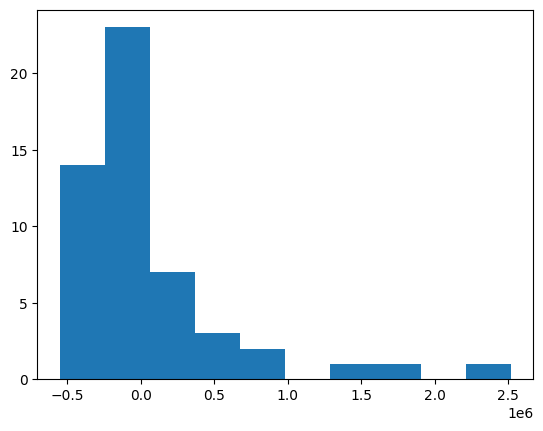

In [79]:
# Сгенерировано с помощью ИИ
coef_l2_gs = gs2.best_estimator_.named_steps['ridge'].coef_
preprocessor = gs2.best_estimator_.named_steps['preprocessor']
feature_names = (
    num_columns + 
    list(preprocessor.named_transformers_['cat'].get_feature_names_out(cat_columns))
)

coef_df = pd.DataFrame({
    'feature': feature_names, 
    'coefficient': coef_l2_gs
}).sort_values('coefficient', key=abs, ascending=False)

print(coef_df.tail(10))
plt.hist(coef_l2_gs)

Вывод: качество прогноза занчительно улучшилось после добавления категориальных переменных. Судя по коэффициентам особую роль сыграло преобразование и учет в модели столбца с маркой автомобиля

**ВЫВОДЫ ПО ЧАСТИ 3:**

- Для улучшений модели был преобразован столбец name, у которого изначально было слишком много уникальных значений для OHE. В результате преобразования кол-во категорий сократилось до 30 на трейне и 25 на тесте

- Этот и другие категориальные признаки были разбиты на отдельные столбцы с помощью OHE

- Была построена дополнительная Ridge модель с категориальными признаками с подбором гиперпараметра с помощью GridSearchCV, в результате чего значительно улучшились метрики качества: R2 вырос до 0.78, а MSE упал до 126 млрд. Во многом это вклад переменной name, у которой очень высокие веса

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какая лучше всего решает задачу бизнеса

In [80]:
# Добавим запрашиваемую бизнес метрику и рассчитаем ее для всех моделей
def business_metric(y_true, y_pred):
    y = pd.DataFrame({'true': np.array(y_true).flatten(), 'pred': y_pred.flatten()})
    y['result'] = ((y['pred'] <= 1.1 * y['true']) & (y['pred'] >= 0.9 * y['true'])).astype(int)
    return float(y['result'].sum()/len(y))

print(f'Модель на вещественных признаках (классическая): {business_metric(y_test, pred1)}')
print(f'Модель на вещественных признаках (со стандартизацией): {business_metric(y_test, pred2)}')
print(f'Модель на вещественных признаках (Lasso): {business_metric(y_test, pred_l1)}')
print(f'Модель на вещественных признаках (Lasso с GridSearchCV): {business_metric(y_test, pred_l1_gs)}')
print(f'Модель на вещественных признаках (ElasticNet с GridSearchCV): {business_metric(y_test, pred_en_gs)}')
print(f'Модель на всех признаках (Ridge с GridSearchCV): {business_metric(y_test_cat, pred_l2_gs)}')

Модель на вещественных признаках (классическая): 0.227
Модель на вещественных признаках (со стандартизацией): 0.227
Модель на вещественных признаках (Lasso): 0.227
Модель на вещественных признаках (Lasso с GridSearchCV): 0.227
Модель на вещественных признаках (ElasticNet с GridSearchCV): 0.247
Модель на всех признаках (Ridge с GridSearchCV): 0.307


**ВЫВОДЫ ПО ЧАСТИ 4:**
- лучшей моделью по бизнес метрике, как и по R2 и MSE, стала модель с учетом  категоральных признаков с Ridge регуляризацией
- тем не менее даже она показывает очень низкое качество: 70% предиктов отклоняются от реальных значений более чем на 10%

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 18 (1 балл)**


**Результаты вашей работы** необходимо разместить в своем Гитхабе. Далее в этот же репозиторий вы прикрепите вторую часть. Под результатами первой части понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)


In [81]:
# Как было сказано в чате, можно сохранить в .pickle только лучшую модель
# В моем случае это модель с вещественными и категориальными признаками с Ridge регуляризацией
model_dir = 'models'
os.makedirs(model_dir, exist_ok=True)

model_path = os.path.join(model_dir, 'model.pkl')
with open(model_path, 'wb') as f:
    pickle.dump(gs2, f, protocol=pickle.HIGHEST_PROTOCOL)

print(f"✅ Модель сохранена: {model_path}")

✅ Модель сохранена: models/model.pkl


In [82]:
# Проверка pickle
with open(model_path, 'rb') as f:
    loaded_model = pickle.load(f)

prediction = loaded_model.predict(X_test_cat)
reg_metrics(y_test_cat, prediction)

Metrics:
    MSE = 126,036,182,368
    R2 = 0.7807
    MAE = 166,943
    RMSE = 355,016
    


(126036182368.09843, 0.7807412642746776)

In [83]:
best_model = gs2.best_estimator_
preprocessor = best_model.named_steps['preprocessor']
feature_names = preprocessor.get_feature_names_out()

feature_names_path = os.path.join(model_dir, 'feature_names.pkl')
with open(feature_names_path, 'wb') as f:
    pickle.dump(feature_names, f, protocol=4)
print(f"✅ Список признаков сохранен: {feature_names_path}")

with open(feature_names_path, 'rb') as f:
    loaded_names = pickle.load(f)

print(loaded_names)
print(f"Кол-во: {len(loaded_names)}")

✅ Список признаков сохранен: models/feature_names.pkl
['num__year' 'num__km_driven' 'num__mileage' 'num__engine'
 'num__max_power' 'cat__name_Audi' 'cat__name_BMW' 'cat__name_Chevrolet'
 'cat__name_Daewoo' 'cat__name_Datsun' 'cat__name_Fiat' 'cat__name_Force'
 'cat__name_Ford' 'cat__name_Honda' 'cat__name_Hyundai' 'cat__name_Isuzu'
 'cat__name_Jaguar' 'cat__name_Jeep' 'cat__name_Kia' 'cat__name_Land'
 'cat__name_Lexus' 'cat__name_MG' 'cat__name_Mahindra' 'cat__name_Maruti'
 'cat__name_Mercedes-Benz' 'cat__name_Mitsubishi' 'cat__name_Nissan'
 'cat__name_Peugeot' 'cat__name_Renault' 'cat__name_Skoda'
 'cat__name_Tata' 'cat__name_Toyota' 'cat__name_Volkswagen'
 'cat__name_Volvo' 'cat__fuel_Diesel' 'cat__fuel_LPG' 'cat__fuel_Petrol'
 'cat__seller_type_Individual' 'cat__seller_type_Trustmark Dealer'
 'cat__transmission_Manual' 'cat__owner_Fourth & Above Owner'
 'cat__owner_Second Owner' 'cat__owner_Test Drive Car'
 'cat__owner_Third Owner' 'cat__seats_4' 'cat__seats_5' 'cat__seats_6'
 'cat_

In [84]:
# Проверка работы модели в Streamlit (можно вбить одинаковые значения, чтобы убедиться, что вывод совпадает)
X_strimleat = pd.DataFrame({'name': ['Audi'], 'year': [2010], 'km_driven': 200, 'fuel': ['Diesel'], 
            'seller_type': ['Individual'], 'transmission': ['Manual'], 'owner': ['новая категория'], 
            'mileage': [666], 'engine': [100], 'max_power': [np.nan], 'seats': [14]})
print(gs2.predict(X_strimleat)[0].round(0))

4161798.0
